In [3]:
%load_ext autoreload
%autoreload 2

from scipy.integrate import solve_ivp
import numpy as np
import matplotlib.pyplot as plt
from functools import partial
from aux import format_plot
import seaborn as sns
from matplotlib.cm import ScalarMappable
from matplotlib.colors import Normalize

plt.rcParams['font.family'] = 'Helvetica'

dt = 0.0001

In [4]:
def gen_gaussian(x, u, s):
    return 1 / np.sqrt(2 * np.pi * s**2) * np.exp(-0.5 * (x - u)**2 / s**2)

In [25]:
class LinearSystem:
    def __init__(
        self,
        n,
        u_func,
        reset_func,
        tau=1.0,
        x_init=None,
        noise_std=0,
        weight_perturbation=0,
        learning_rate=1,
        homeo_rate=0.05,
        alpha=1,
        w_inh=None,
        w_e_scale=1,
        presyn_setpoint=8,
    ):
        """
        Initialize the 2D linear system
        """
        if callable(u_func):
            self.u_func = u_func
            self.u_constant = None
        else:
            u_array = np.array(u_func)
            self.u_func = lambda t: u_array
            self.u_constant = u_array

        self.reset_func = reset_func
        self.tau = tau
        self.learning_rate = learning_rate
        self.homeo_rate = homeo_rate
        self.alpha = alpha
        self.n = n
        self.presyn_setpoint = presyn_setpoint

        # Initialize weights
        self.W0 = np.zeros((3 * n + 1, 3 * n + 1))
        shift_mats_pool_pool = []
        for i in range(1, n):
            w_shift = np.diag(np.ones(n - np.abs(i)), k=i) * 0.5 * (1 + np.cos(2 * np.pi * np.abs(i) / n))
            shift_mats_pool_pool.append(w_shift)
            shift_mats_pool_pool.append(np.transpose(w_shift))
        self.W0[:n, :n] = w_e_scale * np.sum(np.stack(shift_mats_pool_pool), axis=0)
        
#         print(self.W0.sum(axis=1))
        
        self.W0[:n, n:2*n] = np.diag(np.ones((n-1,)), k=1) * 0.5 # right shifting inputs
        self.W0[:n, 2*n:3*n] = np.diag(np.ones((n-1,)), k=-1) * 0.5 # left shifting inputs
        
        self.W0[int(n/2), 3*n] = 0.5 # neuron that drives center neuron regardless of state of first n neurons
        
        w_side_pool = np.diag(np.ones(n,)) - 1
        self.W0[n:2*n, :n] = w_side_pool
        self.W0[2*n:3*n, :n] = w_side_pool

        if w_inh is None:
            self.w_inh = np.concatenate([np.ones((n,)), np.zeros((2 * n + 1,))])
        else:
            self.w_inh = w_inh

        self.x0 = np.zeros(3 * n + 1) if x_init is None else np.array(x_init)

    def system_dynamics(self, t, state_flat):
        """
        System of differential equations: d/dt [x, W]
        Note: solve_ivp expects (t, y)
        """
        n = self.n
        W_dim = 3 * n + 1

        # Unpack state
        x_in = state_flat[:W_dim]
        W = state_flat[W_dim:].reshape((W_dim, W_dim))

        # Ensure non-negative activity
        x = np.clip(x_in, 0, None)

        w_inh = self.w_inh
        u_t = np.array(self.u_func(t))
        reset_t = np.array(self.reset_func(t))  # currently unused

        # --- State dynamics
        dx_dt_raw = 1 / (1e-2) * ((W - w_inh) @ x - x + u_t)
        dx_dt = np.where(np.logical_and(x <= 0, dx_dt_raw < 0), 0, dx_dt_raw)

        # --- Weight dynamics (placeholder)
        homeo_rate = self.homeo_rate
        x_ct_1 = x[:n]
        x_ct_2 = x[n:3 * n + 1]
        z = W[:n, n:3 * n + 1] @ x_ct_2
        dw_dt_ct_1 = (
            self.learning_rate * np.outer(self.alpha * z - dx_dt[:n], x_ct_1)
            + homeo_rate * W[:n, :n] * (self.presyn_setpoint - W[:n, :n].sum(axis=0))[None, :]
        )
        dw_dt = np.zeros((W_dim, W_dim))
        dw_dt[:n, :n] = dw_dt_ct_1


        # Flatten
        dstate_flat = np.concatenate([dx_dt, dw_dt.ravel()])
        return dstate_flat

    def simulate(self, t_span, dt=0.002):
        """
        Simulate system over [t_span[0], t_span[1]] with step dt.
        """
        n = self.n
        W_dim = 3 * n + 1
        t_eval = np.arange(t_span[0], t_span[1], dt)
        initial_state = np.concatenate([self.x0, self.W0.ravel()])

        # --- Solve ODE
        sol = solve_ivp(
            fun=self.system_dynamics,
            t_span=t_span,
            y0=initial_state,
            t_eval=t_eval,
            method='RK23',    # behaves like odeint but with better diagnostics
            rtol=1e-7,
            atol=1e-7,
        )

        if not sol.success:
            print("Integration failed:", sol.message)

        # --- Unpack results
        solution = sol.y.T
        x_out = solution[:, :W_dim]
        W_out = solution[:, W_dim:].reshape(len(t_eval), W_dim, W_dim)
        u_history = np.array([self.u_func(time) for time in t_eval])

        return t_eval, x_out, W_out, u_history
    

# Modified simulation function
def run_simulation(
    n=5,
    u_funcs=None,
    reset_funcs=None,
    x_init_peak_locs=None,
    learning_rate=1,
    homeo_rate=0.05,
    alpha=1,
    seed=None,
    t_sim=(0, 200),
    weight_perturbation=0,
    color_by=None,
    reinitialize=False,
    noise_std=0,
    tau=2,
    save_path=None,
    make_cbar=False,
    w_inh=None,
    w_e_scale=1,
    presyn_setpoint=8,
    cbar_label=None,
    y_lim_1=None,
    y_lim_2=None,
    y_lim_3=None,
    y_lim_4=None,
    width=1,
):
    """
    Run simulation with time-varying input
    
    Parameters:
    u_func: function that takes time t and returns [u1(t), u2(t)]
           if None, uses constant input [0.5, 0.5]
    """
    
    # Multiple initial conditions for x1_init
    if seed:
        np.random.seed(seed)

    if x_init_peak_locs is None:
        n_trials = len(u_funcs) if u_funcs is not None else 10
        x_init_peak_locs = np.clip(np.linspace(0.05, 0.95, n_trials), 0, 1)
                                           
    s = 3
                                           
    x = np.arange(n)
    
    x_init_values = [
        np.concatenate([
            np.clip(
                5 * gen_gaussian(x, x_init_peak_loc * n, s)
                + np.random.normal(scale=np.ones(n) * 0),
                0,
                None,
            ),
            np.zeros((2*n+1)),
        ])
        for x_init_peak_loc in x_init_peak_locs
    ]
    
    w_inh_full = np.zeros((3*n + 1, 3*n + 1))
    w_inh_full[:n, :n] =  w_inh[:, None]

    # Default to constant input for backward compatibility
    if u_funcs is None:
        u_funcs = [lambda t: np.concatenate([np.ones((n)) * 0.5, np.zeros((2*n + 1))])] * len(x_init_values)
    if reset_funcs is None:
        reset_funcs = [lambda t: 0] * len(x_init_values)

    cmap = sns.color_palette("magma", as_cmap=True)
    if color_by is None:
        color_var = x_init_peak_locs
    else:
        m = np.abs(color_by).max()
        color_var = 0.5 * (1 + color_by/m)
    colors = cmap(color_var)
    
    # Storage for all simulations
    all_results = []
    
    print(f"Running simulations for {len(x_init_values)} initial conditions...")
    
    scale = 0.6
    fig_all, axes_all = plt.subplots(1, 1, figsize=(4 * scale * width, 4 * scale))
    axes_all.set_xlabel('Time')
    axes_all.set_ylabel('Bump loc.')
    axes_all.set_ylim(0, 10)
    
    fig_corr, axes_corr = plt.subplots(1, 1, figsize=(4 * scale * width, 4 * scale))
    axes_corr.set_xlabel('Integrated input')
    axes_corr.set_ylabel('Bump loc.')
    axes_corr.set_ylim(0, 10)
    axes_corr.set_xlim(-0.1, 1.1)
    
    for i, (x_init, color) in enumerate(zip(x_init_values, colors)):
        # Set up the plot - now 4 rows, 1 column
        scale = 0.3
        fig, axes = plt.subplots(2, 1, figsize=(8 * scale * width, 7 * scale))
        scale = 0.6
        fig_w, axes_w = plt.subplots(2, 1, figsize=(4 * scale * width, 7 * scale))
        fig_w_dyn, axes_w_dyn = plt.subplots(1, 1, figsize=(4 * scale * width, 3.5 * scale))
        # Create system with this initial condition and time-varying input
                                
        system = LinearSystem(n, u_funcs[i], reset_funcs[i], tau, x_init=x_init, noise_std=0, 
                            weight_perturbation=weight_perturbation, 
                            learning_rate=learning_rate, homeo_rate=homeo_rate, alpha=alpha, w_inh=w_inh_full,
                            w_e_scale=w_e_scale, presyn_setpoint=presyn_setpoint)
        
        # Simulate
        t, x, w, u_history = system.simulate(t_sim, dt=0.0001)
        all_results.append((t, x, w, u_history))
        
        
        # Phase portrait (position 0)
        axes[0].matshow(x.T[:10, :], aspect='auto')
        axes[0].set_xticks([0, int(t_sim[1]/dt)], [0, t_sim[1]])
        
#         axes[0].scatter(x1[0], x2[0], marker='o', edgecolor=color, facecolor='none', s=50, alpha=0.8)
#         axes[0].scatter(x1[-1], x2[-1], marker='o', color=color, s=50, alpha=0.8)
        
        # State variables (position 1 - original (0,0) plot)
        loc_trace = np.dot(np.arange(n), (x[:, :n] / (x[:, :n].sum(axis=1)[:, None] + 1e-6)).T)
        
        loc_trace = np.where(x[:, :n].sum(axis=1) > 1e-3, loc_trace, np.nan)
        
        axes[1].plot(
            t,
            loc_trace,
            color=color,
            linewidth=1.5,
            alpha=0.8,
        )
        
        axes_all.plot(
            t,
            loc_trace,
            color=color,
            linewidth=1.5,
            alpha=0.8,
        )
        
        
        vscale=2
        axes_w[0].matshow(w[0, :, :], cmap='bwr', vmin=-vscale, vmax=vscale)
        axes_w[1].matshow(w[-1, :, :], cmap='bwr', vmin=-vscale, vmax=vscale)
        
        for i_w in range(n):
            for j_w in range(n):
                axes_w_dyn.plot(np.arange(w.shape[0]) * dt, w[:, i_w, j_w])
        
        format_plot(axes)
        fig.tight_layout()
        format_plot(axes_w)
        fig_w.tight_layout()
        format_plot(axes_w_dyn)
        fig_w_dyn.tight_layout()
        
        axes_corr.scatter(color_var[i], loc_trace[-1], color='black')
    
        axes[0].set_xlabel('Time')
        axes[0].set_ylabel('Cell')
        
        axes[1].set_xlabel('Time')
        axes[1].set_ylabel('Bump loc.')
        
        for k in range(2):
            axes_w[k].set_xlabel('Presyn index')
            axes_w[k].set_ylabel('Postsyn index')
    
    format_plot(axes_all)
    fig_all.tight_layout()
    
    format_plot(axes_corr)
    fig_corr.tight_layout()
    
    plt.show()
    
    fig_all.savefig(save_path + '_all_paths' + '.svg')
    fig_corr.savefig(save_path + '_corr' + '.svg')
    
    
    if save_path is not None:
        fig.savefig(save_path + '.png', bbox_inches='tight')
        fig.savefig(save_path + '.svg', bbox_inches='tight')
    
    return all_results, fig


Running simulations for 10 initial conditions...


/var/folders/rp/n8h2l6w51774kxnq18z19s8r0000gn/T/ipykernel_5236/3329884482.py:234: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, axes = plt.subplots(2, 1, figsize=(8 * scale * width, 7 * scale))


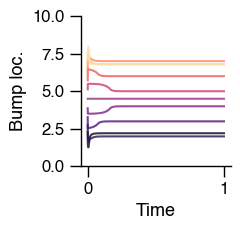

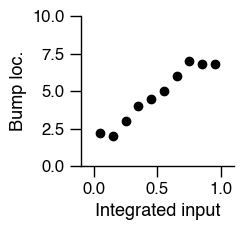

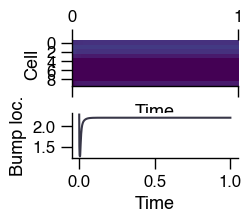

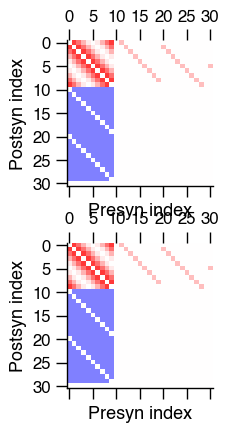

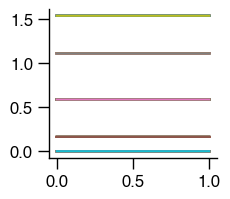

...

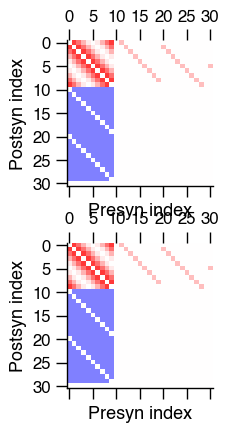

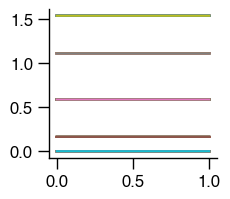

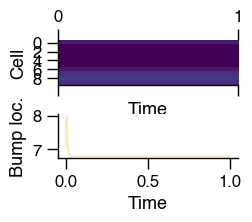

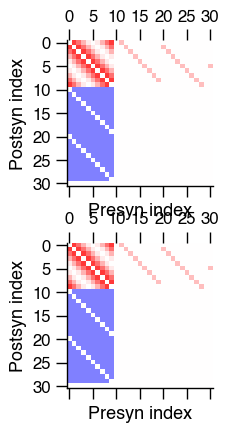

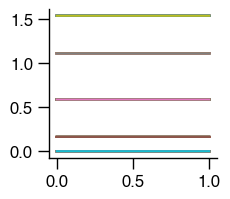

In [26]:
n = 10

run_simulation(
    n=n,
    homeo_rate=0,
    learning_rate=0,
    seed=15,
    weight_perturbation=0,
    noise_std=0.2,
    t_sim=(0, 1),
    make_cbar=True,
    save_path='figures/handbuilt_rules/2d_handbuilt_ex_tuned',
    y_lim_2=(-1.2, 1.2),
    y_lim_3=(1, 2),
    y_lim_4=(0, 1),
    w_e_scale=1.7,
    w_inh=np.random.normal(size=(n,), loc=1, scale=0) * 2,
)
None

Running simulations for 10 initial conditions...


/var/folders/rp/n8h2l6w51774kxnq18z19s8r0000gn/T/ipykernel_5236/3329884482.py:234: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, axes = plt.subplots(2, 1, figsize=(8 * scale * width, 7 * scale))


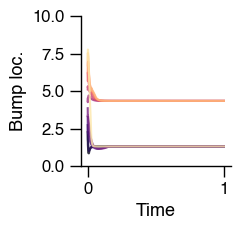

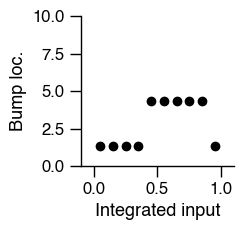

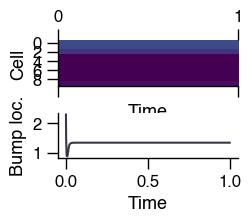

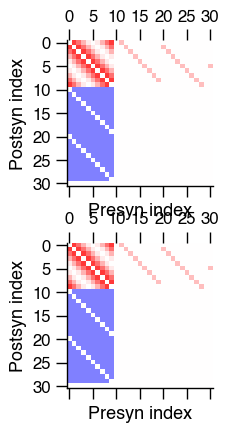

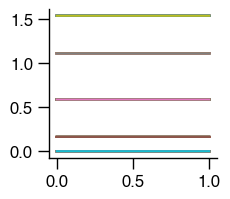

...

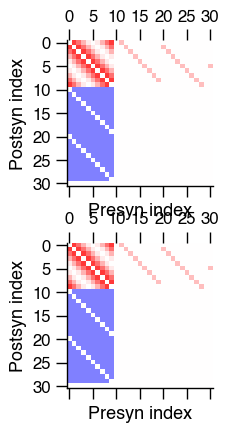

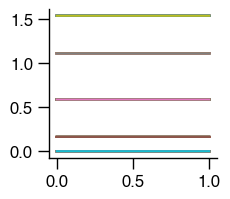

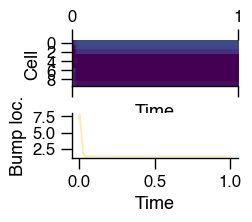

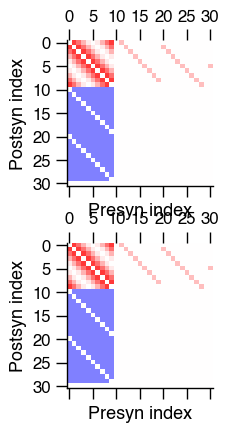

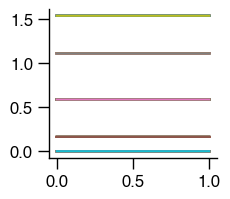

In [27]:
n = 10

run_simulation(
    n=n,
    homeo_rate=0,
    learning_rate=0,
    seed=15,
    weight_perturbation=0,
    noise_std=0.2,
    t_sim=(0, 1),
    make_cbar=True,
    save_path='figures/handbuilt_rules/2d_handbuilt_ex_tuned',
    y_lim_2=(-1.2, 1.2),
    y_lim_3=(1, 2),
    y_lim_4=(0, 1),
    w_e_scale=1.7,
    w_inh=np.random.normal(size=(n,), loc=1, scale=0.1) * 2,
)
None

Running simulations for 10 initial conditions...


/var/folders/rp/n8h2l6w51774kxnq18z19s8r0000gn/T/ipykernel_5236/3329884482.py:234: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, axes = plt.subplots(2, 1, figsize=(8 * scale * width, 7 * scale))


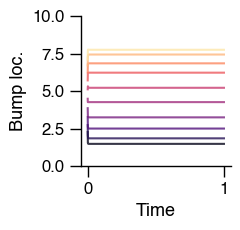

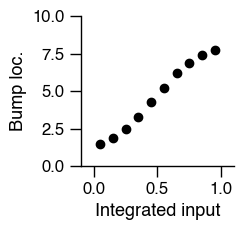

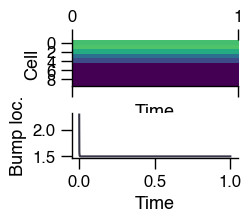

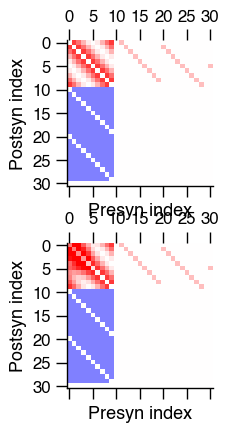

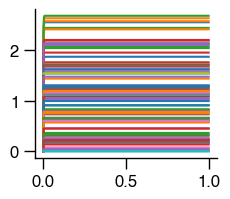

...

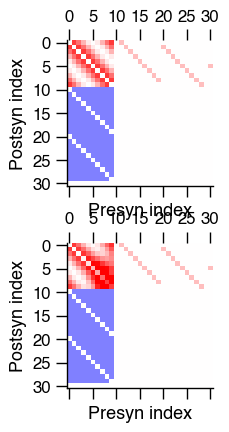

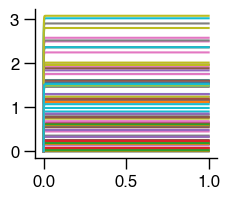

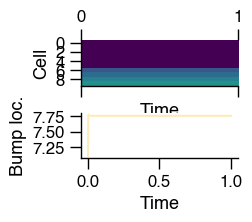

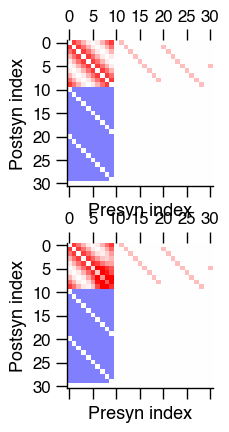

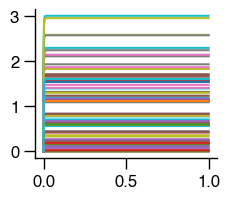

In [28]:
n = 10

run_simulation(
    n=n,
    homeo_rate=0,
    learning_rate=10,
    seed=15,
    weight_perturbation=0,
    noise_std=0.2,
    t_sim=(0, 1),
    make_cbar=True,
    save_path='figures/handbuilt_rules/2d_handbuilt_ex_tuned',
    y_lim_2=(-1.2, 1.2),
    y_lim_3=(1, 2),
    y_lim_4=(0, 1),
    w_e_scale=1.7,
    w_inh=np.random.normal(size=(n,), loc=1, scale=0.1) * 2
)
None

Running simulations for 10 initial conditions...


/var/folders/rp/n8h2l6w51774kxnq18z19s8r0000gn/T/ipykernel_5236/3329884482.py:234: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, axes = plt.subplots(2, 1, figsize=(8 * scale * width, 7 * scale))


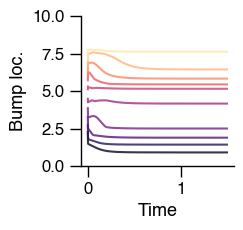

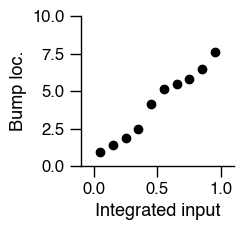

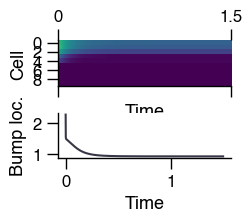

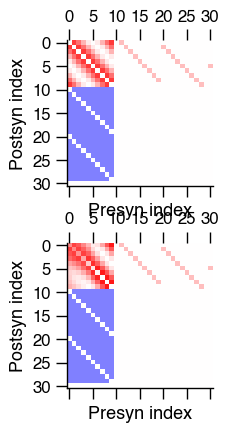

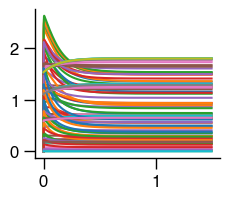

...

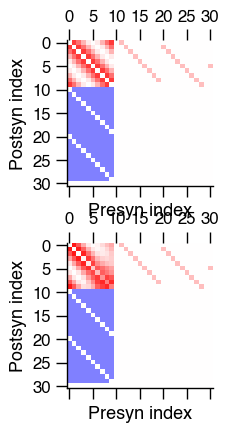

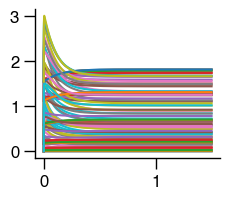

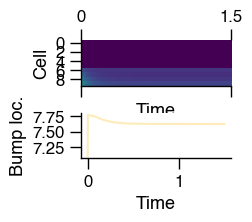

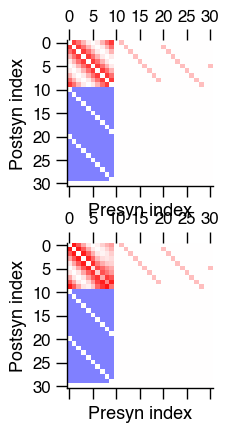

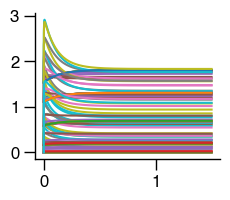

In [29]:
n = 10

run_simulation(
    n=n,
    homeo_rate=1,
    learning_rate=10,
    seed=15,
    weight_perturbation=0,
    noise_std=0.2,
    t_sim=(0, 1.5),
    make_cbar=True,
    save_path='figures/handbuilt_rules/2d_handbuilt_ex_tuned',
    y_lim_2=(-1.2, 1.2),
    y_lim_3=(1, 2),
    y_lim_4=(0, 1),
    w_e_scale=1.7,
    w_inh=np.random.normal(size=(n,), loc=1, scale=0.1) * 2,
    presyn_setpoint=8,
)
None

Running simulations for 20 initial conditions...


/var/folders/rp/n8h2l6w51774kxnq18z19s8r0000gn/T/ipykernel_5236/3329884482.py:234: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, axes = plt.subplots(2, 1, figsize=(8 * scale * width, 7 * scale))


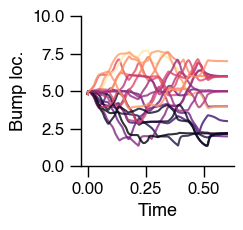

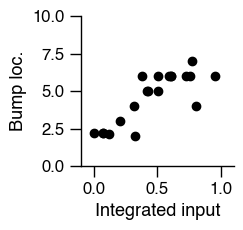

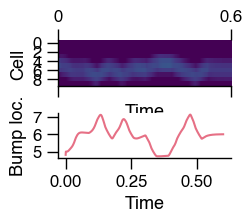

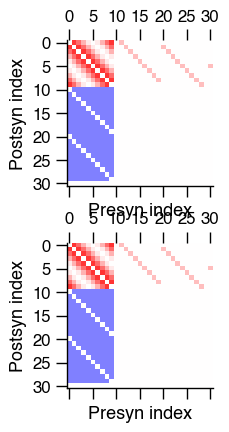

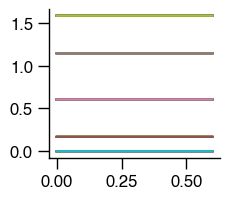

...

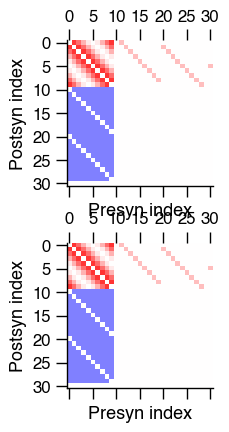

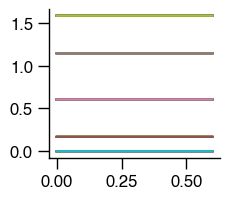

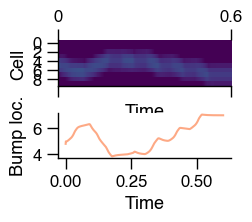

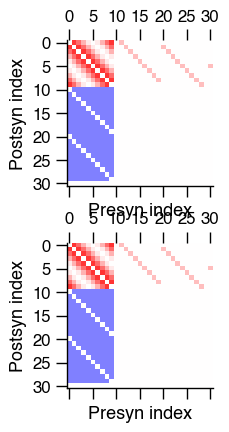

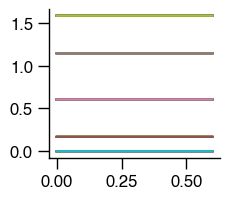

In [35]:
n = 10

def make_u_funcs(n_trials, n, t, dt):    
    def u_func(t_prime, inp):
        return np.concatenate(
            [
                np.array([
                    np.interp(t_prime, t, inp[2+i, :])
                    for i in range(n)
                ]),
                np.repeat(np.interp(t_prime, t, inp[0, :]), n),
                np.repeat(np.interp(t_prime, t, inp[1, :]), n),
                np.array([np.interp(t_prime, t, inp[n+2, :])]),
            ]
        )

    funcs = []
    all_inps = []

    for i in range(n_trials):
        block_len = 0.1
        inp = np.zeros((3 + n, len(t)))
        for t_p in np.linspace(0, t.max(), int((t.max() + 1)/block_len)):
            if t_p < 0.5:
                u_block = np.random.rand(2)
            else:
                u_block = np.zeros((2))
            inp[:2, int(t_p/dt):int((t_p + block_len)/dt)] = 0.7 * u_block[:, None]
        inp[2:2+n, :] = 0.5
        all_inps.append(inp)
        funcs.append(partial(u_func, inp=inp))
    return funcs, all_inps

u_funcs, all_inps = make_u_funcs(20, n, np.arange(0, 0.6, dt), dt=dt)

run_simulation(
    x_init_peak_locs=[0.5] * len(u_funcs),
    n=n,
    u_funcs=u_funcs,
    homeo_rate=0,
    learning_rate=0,
    alpha=0,
    seed=15,
    weight_perturbation=0,
    noise_std=0.2,
    t_sim=(0, 0.6),
    make_cbar=True,
    save_path='figures/handbuilt_rules/2d_handbuilt_ex_tuned',
    y_lim_2=(-1.2, 1.2),
    y_lim_3=(1, 2),
    y_lim_4=(0, 1),
    w_e_scale=1.75,
    w_inh=np.random.normal(size=(n,), loc=1, scale=0) * 2,
    color_by=np.array([(inp[1].sum() - inp[0].sum()) for inp in all_inps]),
)
None

20
Running simulations for 20 initial conditions...


/var/folders/rp/n8h2l6w51774kxnq18z19s8r0000gn/T/ipykernel_63448/100701831.py:225: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, axes = plt.subplots(4, 1, figsize=(4 * scale * width, 14 * scale))


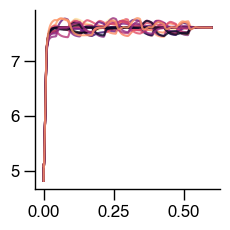

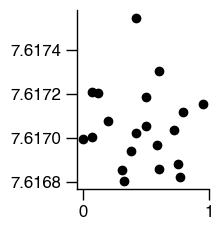

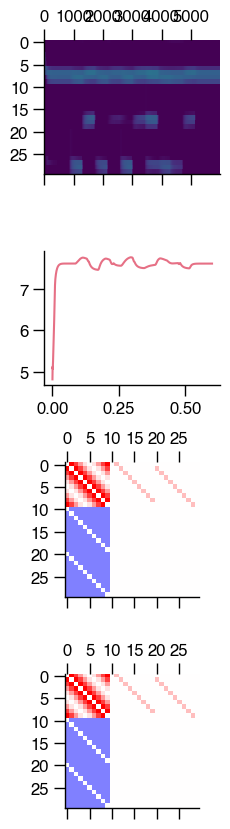

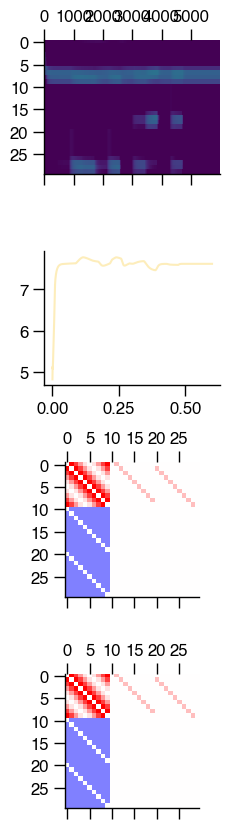

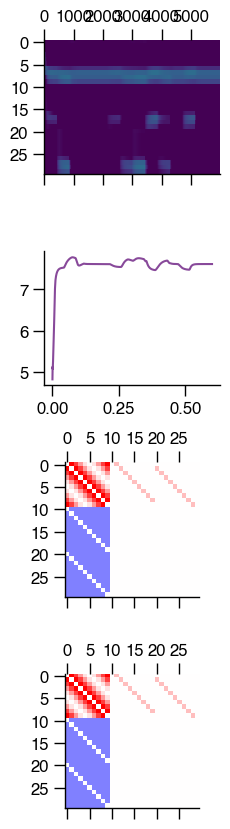

...

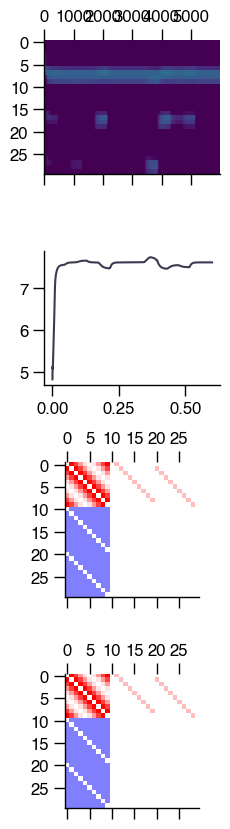

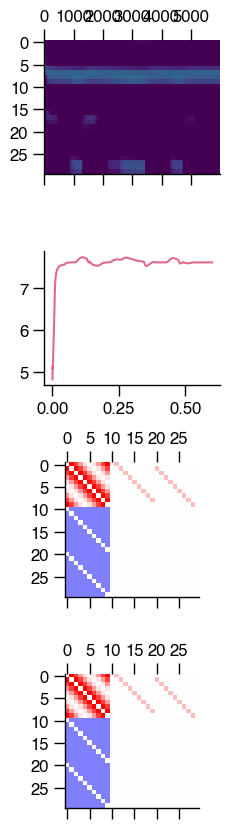

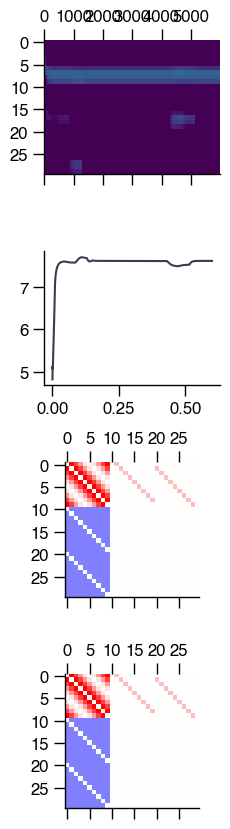

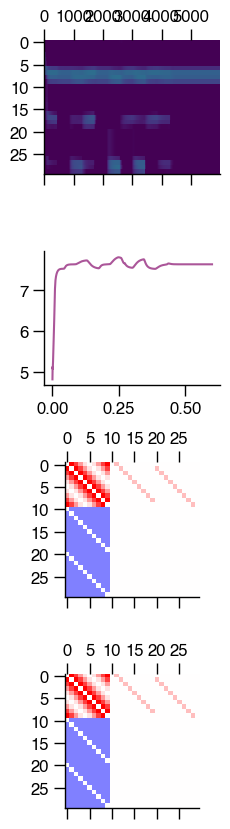

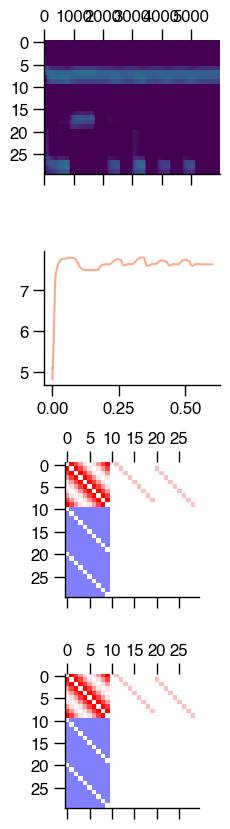

In [160]:
n = 10

def make_u_funcs(n_trials, n, t, dt):    
    def u_func(t_prime, inp):
        return np.concatenate(
            [
                np.array([
                    np.interp(t_prime, t, inp[2+i, :])
                    for i in range(n)
                ]),
                np.repeat(np.interp(t_prime, t, inp[0, :]), n),
                np.repeat(np.interp(t_prime, t, inp[1, :]), n),
            ]
        )

    funcs = []
    all_inps = []

    for i in range(n_trials):
        block_len = 0.1
        inp = np.zeros((2 + n, len(t)))
        for t_p in np.linspace(0, t.max(), int((t.max() + 1)/block_len)):
            if t_p < 0.5:
                u_block = np.random.rand(2)
            else:
                u_block = np.zeros((2))
            inp[:2, int(t_p/dt):int((t_p + block_len)/dt)] = 0.7 * u_block[:, None]
        inp[2:, :] = 0.5
        all_inps.append(inp)
        funcs.append(partial(u_func, inp=inp))
    return funcs, all_inps

u_funcs, all_inps = make_u_funcs(20, n, np.arange(0, 0.6, dt), dt=dt)

print(len(u_funcs))

run_simulation(
    x_init_peak_locs=[0.5] * len(u_funcs),
    n=n,
    u_funcs=u_funcs,
    homeo_rate=0,
    learning_rate=0,
    alpha=0,
    seed=15,
    weight_perturbation=0,
    noise_std=0.2,
    t_sim=(0, 0.6),
    make_cbar=True,
    save_path='figures/handbuilt_rules/2d_handbuilt_ex_tuned',
    y_lim_2=(-1.2, 1.2),
    y_lim_3=(1, 2),
    y_lim_4=(0, 1),
    w_e_scale=2.3,
    w_inh=np.random.normal(size=(n,), loc=1, scale=0.1) * 2,
    color_by=np.array([(inp[1].sum() - inp[0].sum()) for inp in all_inps]),
)
None

20
Running simulations for 20 initial conditions...


/var/folders/rp/n8h2l6w51774kxnq18z19s8r0000gn/T/ipykernel_5236/3329884482.py:234: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, axes = plt.subplots(2, 1, figsize=(8 * scale * width, 7 * scale))


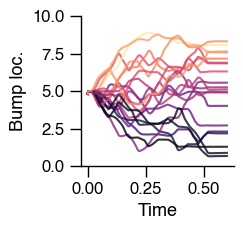

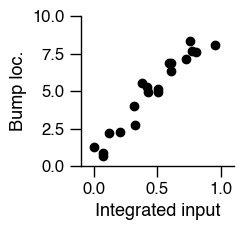

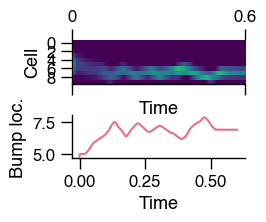

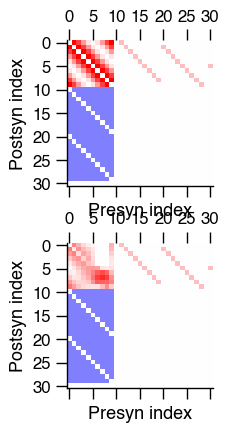

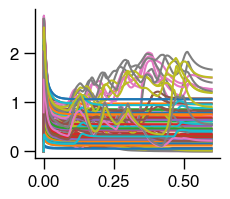

...

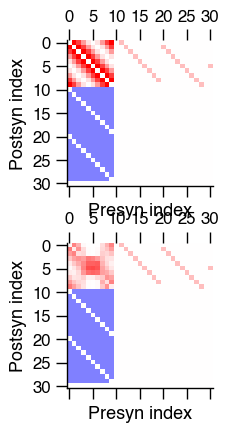

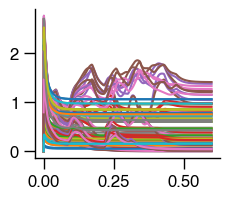

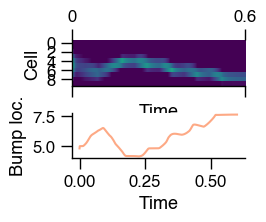

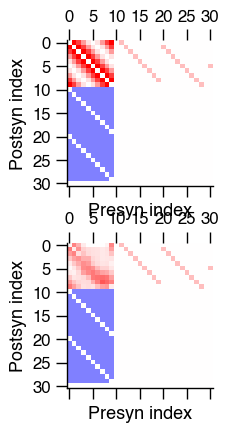

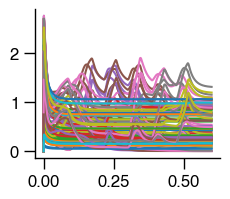

In [36]:
n = 10

def make_u_funcs(n_trials, n, t, dt):    
    def u_func(t_prime, inp):
        return np.concatenate(
            [
                np.array([
                    np.interp(t_prime, t, inp[2+i, :])
                    for i in range(n)
                ]),
                np.repeat(np.interp(t_prime, t, inp[0, :]), n),
                np.repeat(np.interp(t_prime, t, inp[1, :]), n),
                np.array([np.interp(t_prime, t, inp[n+2, :])]),
            ]
        )

    funcs = []
    all_inps = []

    for i in range(n_trials):
        block_len = 0.1
        inp = np.zeros((3 + n, len(t)))
        for t_p in np.linspace(0, t.max(), int((t.max() + 1)/block_len)):
            if t_p < 0.5:
                u_block = np.random.rand(2)
            else:
                u_block = np.zeros((2))
            inp[:2, int(t_p/dt):int((t_p + block_len)/dt)] = 0.7 * u_block[:, None]
        inp[2:2 + n, :] = 0.5
        all_inps.append(inp)
        funcs.append(partial(u_func, inp=inp))
    return funcs, all_inps

u_funcs, all_inps = make_u_funcs(20, n, np.arange(0, 0.6, dt), dt=dt)

print(len(u_funcs))

run_simulation(
    x_init_peak_locs=[0.5] * len(u_funcs),
    n=n,
    u_funcs=u_funcs,
    homeo_rate=10,
    presyn_setpoint=5,
    learning_rate=10,
    alpha=200,
    seed=15,
    weight_perturbation=0,
    noise_std=0.2,
    t_sim=(0, 0.6),
    make_cbar=True,
    save_path='figures/handbuilt_rules/2d_handbuilt_ex_tuned',
    y_lim_2=(-1.2, 1.2),
    y_lim_3=(1, 2),
    y_lim_4=(0, 1),
    w_e_scale=2.3,
    w_inh=np.random.normal(size=(n,), loc=1, scale=0) * 2,
    color_by=np.array([(inp[1].sum() - inp[0].sum()) for inp in all_inps]),
)
None

20
Running simulations for 20 initial conditions...


/var/folders/rp/n8h2l6w51774kxnq18z19s8r0000gn/T/ipykernel_5236/2143276237.py:234: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, axes = plt.subplots(2, 1, figsize=(8 * scale * width, 7 * scale))


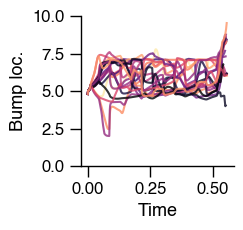

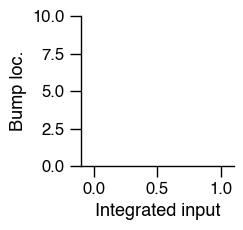

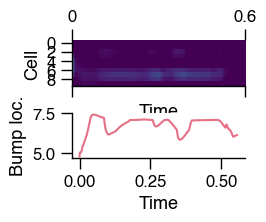

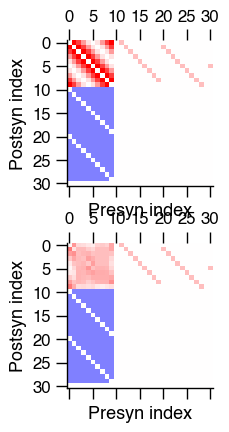

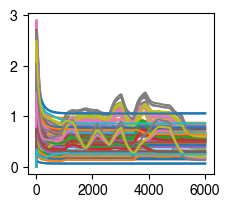

...

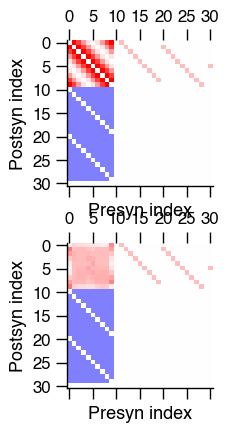

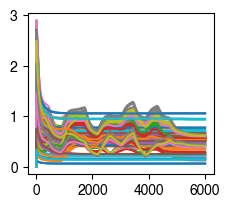

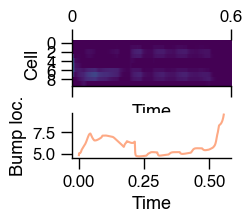

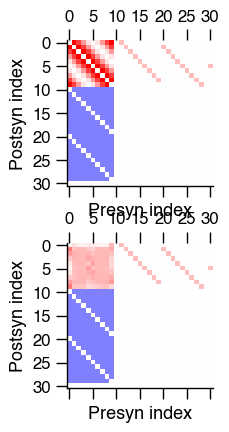

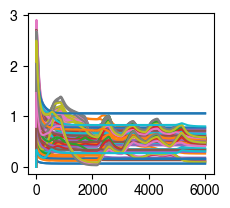

In [16]:
n = 10

def make_u_funcs(n_trials, n, t, dt):    
    def u_func(t_prime, inp):
        return np.concatenate(
            [
                np.array([
                    np.interp(t_prime, t, inp[2+i, :])
                    for i in range(n)
                ]),
                np.repeat(np.interp(t_prime, t, inp[0, :]), n),
                np.repeat(np.interp(t_prime, t, inp[1, :]), n),
                np.array([np.interp(t_prime, t, inp[n+2, :])]),
            ]
        )

    funcs = []
    all_inps = []

    for i in range(n_trials):
        block_len = 0.1
        inp = np.zeros((3 + n, len(t)))
        for t_p in np.linspace(0, t.max(), int((t.max() + 1)/block_len)):
            if t_p < 0.5:
                u_block = np.random.rand(2)
            else:
                u_block = np.zeros((2))
            inp[:2, int(t_p/dt):int((t_p + block_len)/dt)] = 0.7 * u_block[:, None]
        inp[2:, 2:2 + n] = 0.5
        all_inps.append(inp)
        funcs.append(partial(u_func, inp=inp))
    return funcs, all_inps

u_funcs, all_inps = make_u_funcs(20, n, np.arange(0, 0.6, dt), dt=dt)

print(len(u_funcs))

run_simulation(
    x_init_peak_locs=[0.5] * len(u_funcs),
    n=n,
    u_funcs=u_funcs,
    homeo_rate=10,
    presyn_setpoint=5,
    learning_rate=10,
    alpha=200,
    seed=15,
    weight_perturbation=0,
    noise_std=0.2,
    t_sim=(0, 0.6),
    make_cbar=True,
    save_path='figures/handbuilt_rules/2d_handbuilt_ex_tuned',
    y_lim_2=(-1.2, 1.2),
    y_lim_3=(1, 2),
    y_lim_4=(0, 1),
    w_e_scale=2.3,
    w_inh=np.random.normal(size=(n,), loc=1, scale=0.05) * 2,
    color_by=np.array([(inp[1].sum() - inp[0].sum()) for inp in all_inps]),
)
None

2
Running simulations for 2 initial conditions...


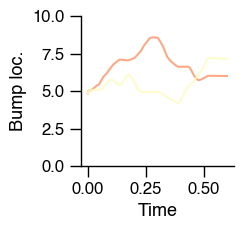

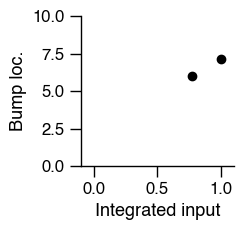

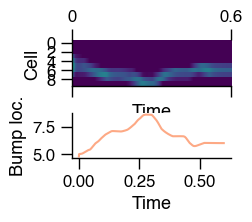

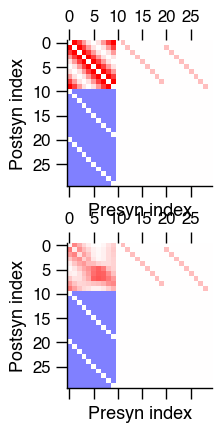

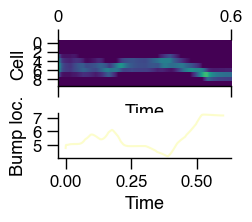

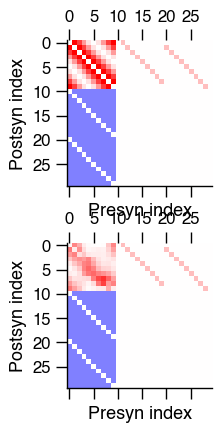

In [239]:
np.random.seed(102)
n = 10

def make_u_funcs(n_trials, n, t, dt):    
    def u_func(t_prime, inp):
        return np.concatenate(
            [
                np.array([
                    np.interp(t_prime, t, inp[2+i, :])
                    for i in range(n)
                ]),
                np.repeat(np.interp(t_prime, t, inp[0, :]), n),
                np.repeat(np.interp(t_prime, t, inp[1, :]), n),
            ]
        )

    funcs = []
    all_inps = []

    for i in range(n_trials):
        block_len = 0.1
        inp = np.zeros((2 + n, len(t)))
        for t_p in np.linspace(0, t.max(), int((t.max() + 1)/block_len)):
            if t_p < 0.5:
                u_block = np.random.rand(2)
            else:
                u_block = np.zeros((2))
            inp[:2, int(t_p/dt):int((t_p + block_len)/dt)] = 0.7 * u_block[:, None]
        inp[2:, :] = 0.5
        all_inps.append(inp)
        funcs.append(partial(u_func, inp=inp))
    return funcs, all_inps

u_funcs, all_inps = make_u_funcs(2, n, np.arange(0, 0.6, dt), dt=dt)

print(len(u_funcs))

run_simulation(
    x_init_peak_locs=[0.5] * len(u_funcs),
    n=n,
    u_funcs=u_funcs,
    homeo_rate=10,
    presyn_setpoint=5,
    learning_rate=10,
    alpha=200,
    seed=101,
    weight_perturbation=0,
    noise_std=0.2,
    t_sim=(0, 0.6),
    make_cbar=True,
    save_path='figures/handbuilt_rules/10d_inh_het_0p05_all_rules',
    y_lim_2=(-1.2, 1.2),
    y_lim_3=(1, 2),
    y_lim_4=(0, 1),
    w_e_scale=2.3,
    w_inh=np.random.normal(size=(n,), loc=1, scale=0.05) * 2,
    color_by=np.array([(inp[1].sum() - inp[0].sum()) for inp in all_inps]),
)
None

20
Running simulations for 20 initial conditions...


/var/folders/rp/n8h2l6w51774kxnq18z19s8r0000gn/T/ipykernel_63448/100701831.py:225: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, axes = plt.subplots(4, 1, figsize=(4 * scale * width, 14 * scale))


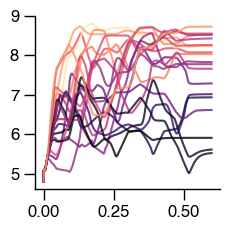

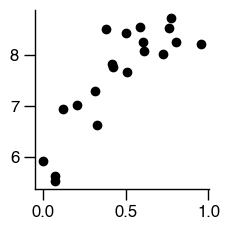

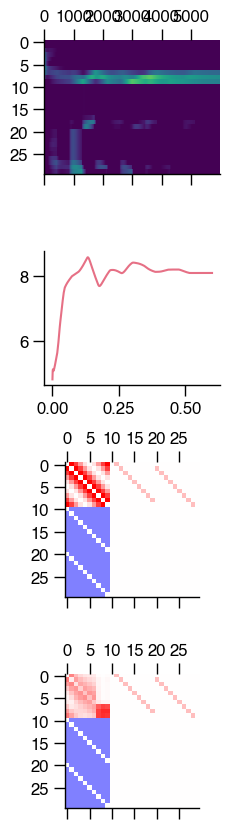

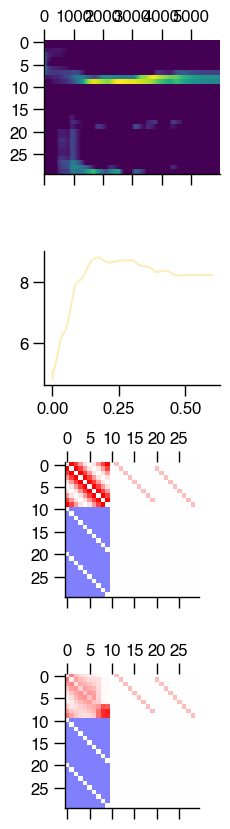

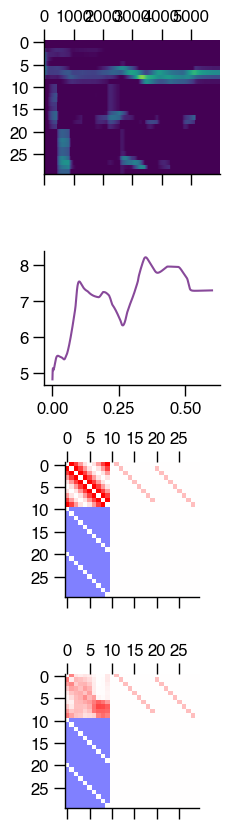

...

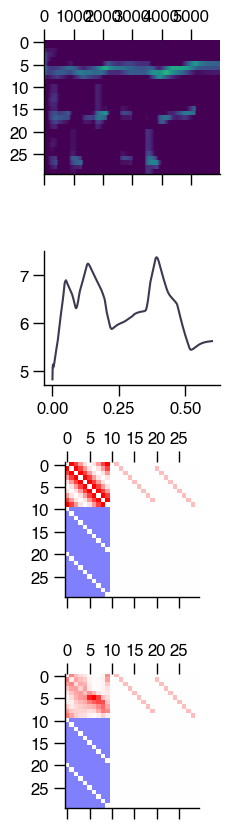

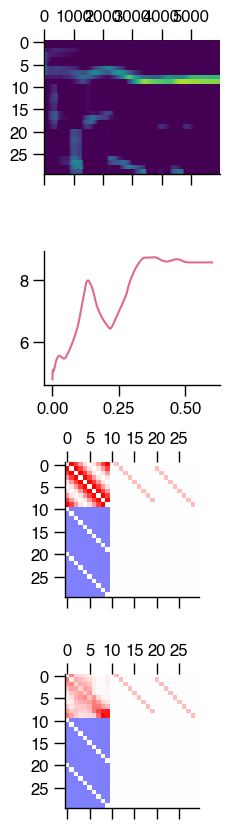

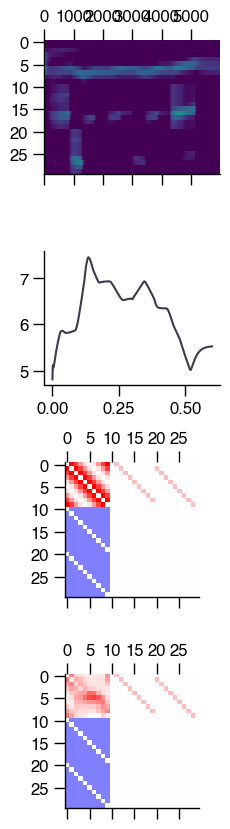

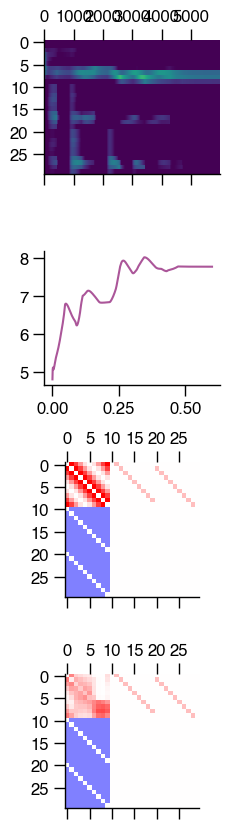

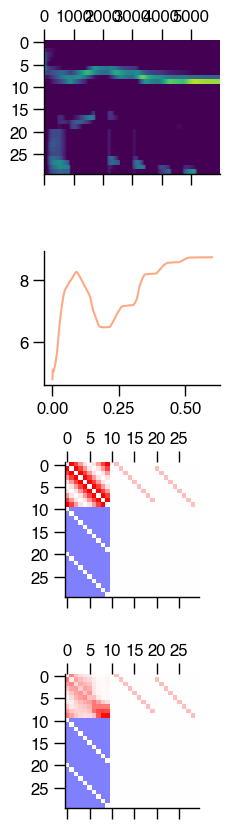

In [165]:
n = 10

def make_u_funcs(n_trials, n, t, dt):    
    def u_func(t_prime, inp):
        return np.concatenate(
            [
                np.array([
                    np.interp(t_prime, t, inp[2+i, :])
                    for i in range(n)
                ]),
                np.repeat(np.interp(t_prime, t, inp[0, :]), n),
                np.repeat(np.interp(t_prime, t, inp[1, :]), n),
            ]
        )

    funcs = []
    all_inps = []

    for i in range(n_trials):
        block_len = 0.1
        inp = np.zeros((2 + n, len(t)))
        for t_p in np.linspace(0, t.max(), int((t.max() + 1)/block_len)):
            if t_p < 0.5:
                u_block = np.random.rand(2)
            else:
                u_block = np.zeros((2))
            inp[:2, int(t_p/dt):int((t_p + block_len)/dt)] = 0.7 * u_block[:, None]
        inp[2:, :] = 0.5
        all_inps.append(inp)
        funcs.append(partial(u_func, inp=inp))
    return funcs, all_inps

u_funcs, all_inps = make_u_funcs(20, n, np.arange(0, 0.6, dt), dt=dt)

print(len(u_funcs))

run_simulation(
    x_init_peak_locs=[0.5] * len(u_funcs),
    n=n,
    u_funcs=u_funcs,
    homeo_rate=10,
    presyn_setpoint=5,
    learning_rate=10,
    alpha=200,
    seed=15,
    weight_perturbation=0,
    noise_std=0.2,
    t_sim=(0, 0.6),
    make_cbar=True,
    save_path='figures/handbuilt_rules/2d_handbuilt_ex_tuned',
    y_lim_2=(-1.2, 1.2),
    y_lim_3=(1, 2),
    y_lim_4=(0, 1),
    w_e_scale=2.3,
    w_inh=np.random.normal(size=(n,), loc=1, scale=0.1) * 2,
    color_by=np.array([(inp[1].sum() - inp[0].sum()) for inp in all_inps]),
)
None

20
Running simulations for 20 initial conditions...


/var/folders/rp/n8h2l6w51774kxnq18z19s8r0000gn/T/ipykernel_5236/3545988642.py:234: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, axes = plt.subplots(2, 1, figsize=(8 * scale * width, 7 * scale))


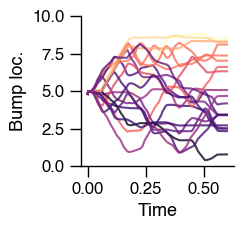

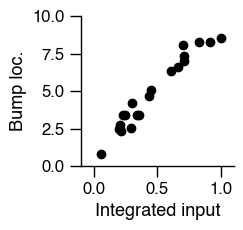

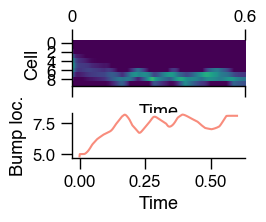

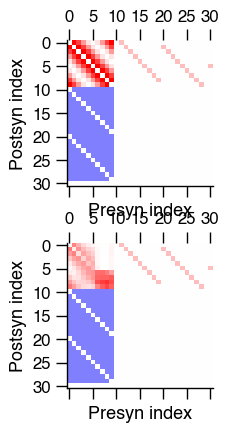

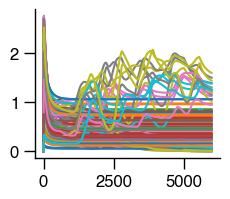

...

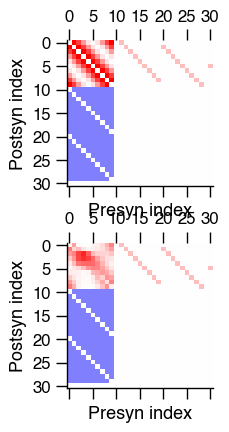

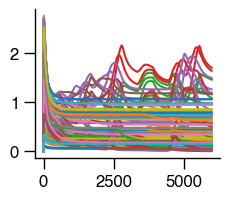

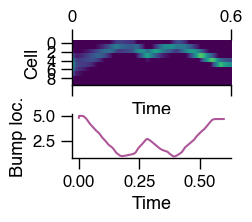

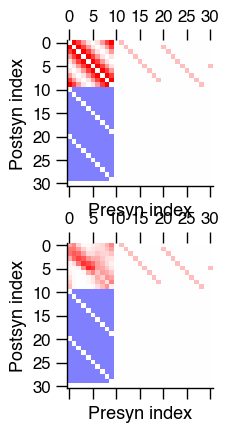

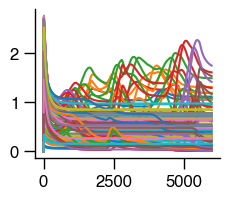

In [24]:
n = 10

def make_u_funcs(n_trials, n, t, dt):    
    def u_func(t_prime, inp):
        return np.concatenate(
            [
                np.array([
                    np.interp(t_prime, t, inp[2+i, :])
                    for i in range(n)
                ]),
                np.repeat(np.interp(t_prime, t, inp[0, :]), n),
                np.repeat(np.interp(t_prime, t, inp[1, :]), n),
                np.array([np.interp(t_prime, t, inp[n+2, :])]),
            ]
        )

    funcs = []
    all_inps = []

    for i in range(n_trials):
        block_len = 0.1
        inp = np.zeros((3 + n, len(t)))
        for t_p in np.linspace(0, t.max(), int((t.max() + 1)/block_len)):
            if t_p < 0.5:
                u_block = np.random.rand(2)
            else:
                u_block = np.zeros((2))
            inp[:2, int(t_p/dt):int((t_p + block_len)/dt)] = 0.7 * u_block[:, None]
        inp[2:2+n, :] = 0.5
        all_inps.append(inp)
        funcs.append(partial(u_func, inp=inp))
    return funcs, all_inps

u_funcs, all_inps = make_u_funcs(20, n, np.arange(0, 1, dt), dt=dt)

print(len(u_funcs))

run_simulation(
    x_init_peak_locs=[0.5] * len(u_funcs),
    n=n,
    u_funcs=u_funcs,
    homeo_rate=10,
    presyn_setpoint=5,
    learning_rate=10,
    alpha=200,
    seed=15,
    weight_perturbation=0,
    noise_std=0.2,
    t_sim=(0, 0.6),
    make_cbar=True,
    save_path='figures/handbuilt_rules/2d_handbuilt_ex_tuned',
    y_lim_2=(-1.2, 1.2),
    y_lim_3=(1, 2),
    y_lim_4=(0, 1),
    w_e_scale=2.3,
    w_inh=np.random.normal(size=(n,), loc=1, scale=0) * 2,
    color_by=np.array([(inp[1].sum() - inp[0].sum()) for inp in all_inps]),
)
None

20
Running simulations for 20 initial conditions...


/var/folders/rp/n8h2l6w51774kxnq18z19s8r0000gn/T/ipykernel_63448/3926772099.py:229: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, axes = plt.subplots(2, 1, figsize=(8 * scale * width, 7 * scale))


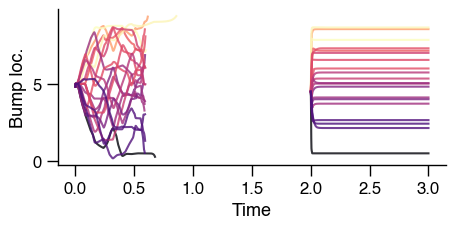

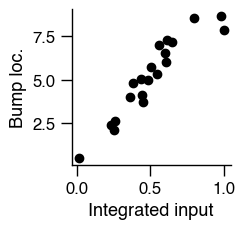

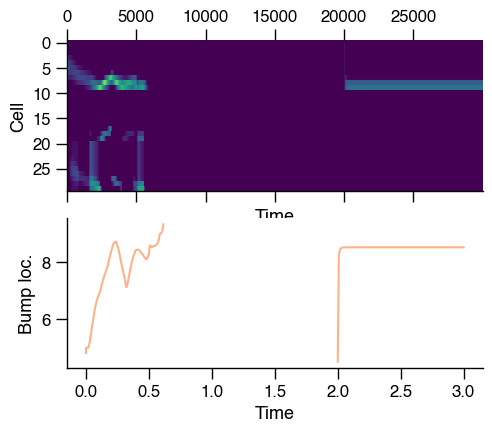

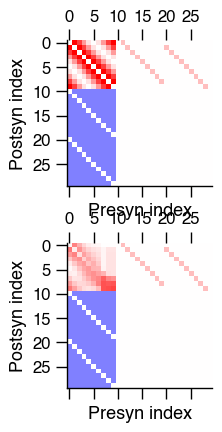

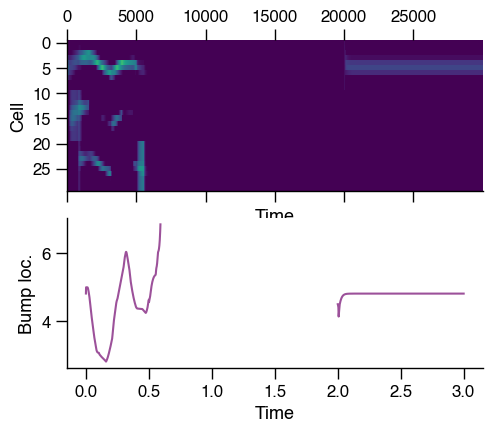

...

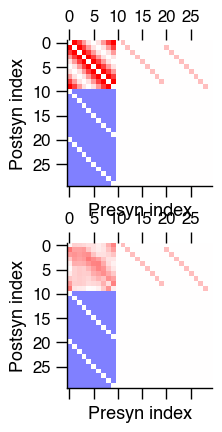

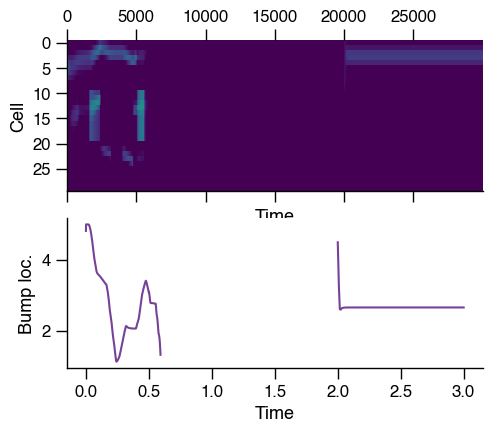

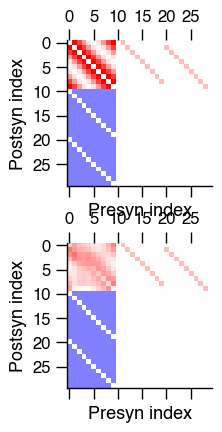

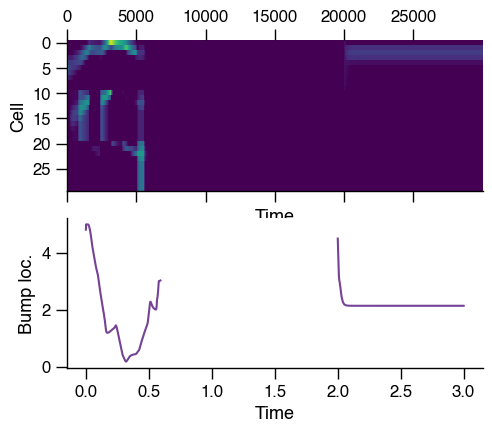

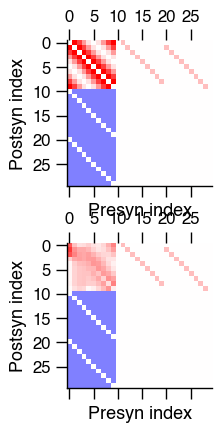

In [200]:
n = 10

def make_u_funcs(n_trials, n, t, dt):    
    def u_func(t_prime, inp):
        return np.concatenate(
            [
                np.array([
                    np.interp(t_prime, t, inp[2+i, :])
                    for i in range(n)
                ]),
                np.repeat(np.interp(t_prime, t, inp[0, :]), n),
                np.repeat(np.interp(t_prime, t, inp[1, :]), n),
            ]
        )

    funcs = []
    all_inps = []

    for i in range(n_trials):
        block_len = 0.1
        inp = np.zeros((2 + n, len(t)))
        for t_p in np.linspace(0, t.max(), int((t.max() + 1)/block_len)):
            if t_p < 0.5:
                u_block = np.random.rand(2)
            else:
                u_block = np.zeros((2))
            inp[:2, int(t_p/dt):int((t_p + block_len)/dt)] = 0.7 * u_block[:, None]
        inp[2:, :int(0.5/dt)] = 0.5
        inp[2:, int(2/dt):] = 0.5
        all_inps.append(inp)
        funcs.append(partial(u_func, inp=inp))
    return funcs, all_inps

u_funcs, all_inps = make_u_funcs(20, n, np.arange(0, 3, dt), dt=dt)

print(len(u_funcs))

run_simulation(
    x_init_peak_locs=[0.5] * len(u_funcs),
    n=n,
    u_funcs=u_funcs,
    homeo_rate=10,
    presyn_setpoint=5,
    learning_rate=10,
    alpha=200,
    seed=15,
    weight_perturbation=0,
    noise_std=0.2,
    t_sim=(0, 3),
    make_cbar=True,
    save_path='figures/handbuilt_rules/2d_handbuilt_ex_tuned',
    y_lim_2=(-1.2, 1.2),
    y_lim_3=(1, 2),
    y_lim_4=(0, 1),
    w_e_scale=2.3,
    w_inh=np.random.normal(size=(n,), loc=1, scale=0) * 2,
    color_by=np.array([(inp[1].sum() - inp[0].sum()) for inp in all_inps]),
)
None

20
Running simulations for 20 initial conditions...


/var/folders/rp/n8h2l6w51774kxnq18z19s8r0000gn/T/ipykernel_63448/3926772099.py:229: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, axes = plt.subplots(2, 1, figsize=(8 * scale * width, 7 * scale))


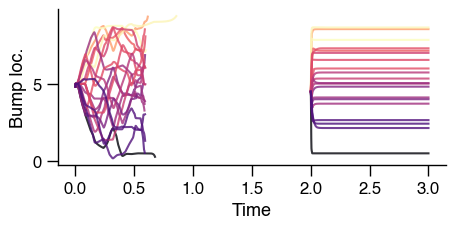

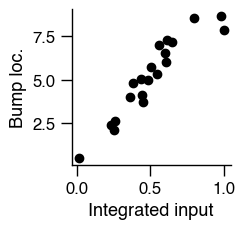

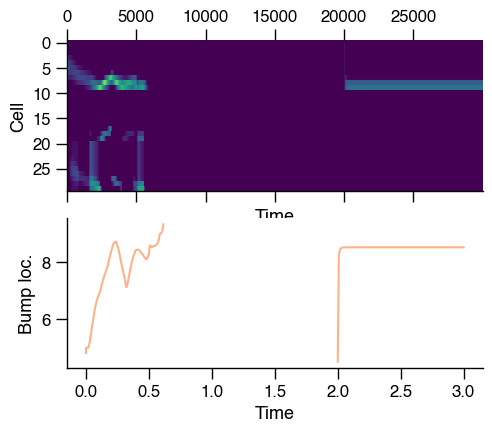

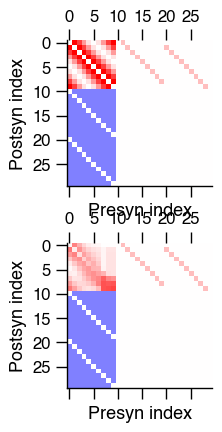

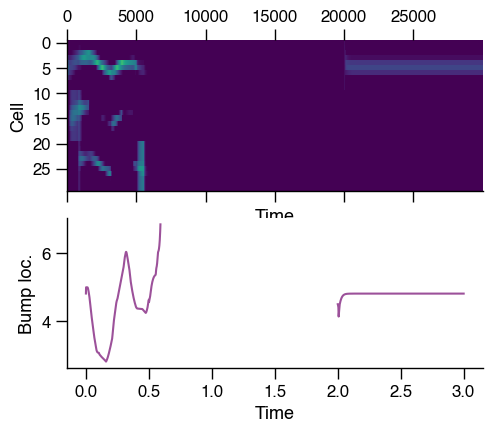

...

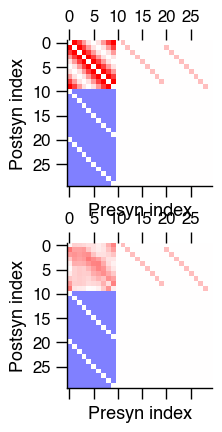

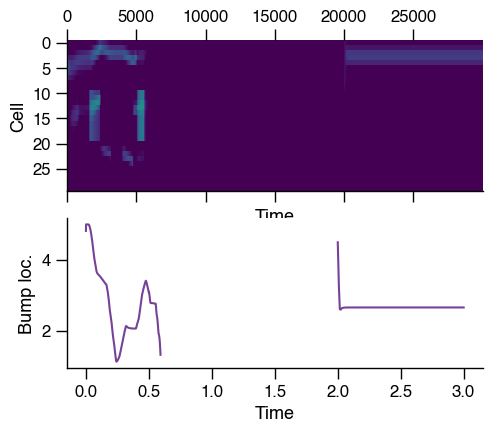

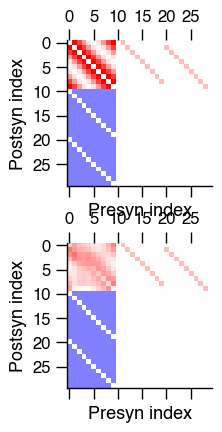

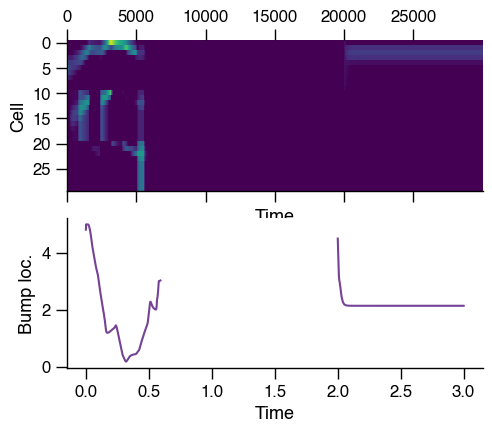

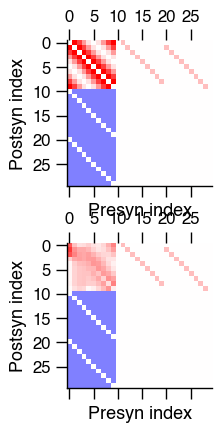

In [201]:
n = 10

def make_u_funcs(n_trials, n, t, dt):    
    def u_func(t_prime, inp):
        return np.concatenate(
            [
                np.array([
                    np.interp(t_prime, t, inp[2+i, :])
                    for i in range(n)
                ]),
                np.repeat(np.interp(t_prime, t, inp[0, :]), n),
                np.repeat(np.interp(t_prime, t, inp[1, :]), n),
            ]
        )

    funcs = []
    all_inps = []

    for i in range(n_trials):
        block_len = 0.1
        inp = np.zeros((2 + n, len(t)))
        for t_p in np.linspace(0, t.max(), int((t.max() + 1)/block_len)):
            if t_p < 0.5:
                u_block = np.random.rand(2)
            else:
                u_block = np.zeros((2))
            inp[:2, int(t_p/dt):int((t_p + block_len)/dt)] = 0.7 * u_block[:, None]
        inp[2:, :int(0.5/dt)] = 0.5
        inp[2:, int(2/dt):] = 0.5
        all_inps.append(inp)
        funcs.append(partial(u_func, inp=inp))
    return funcs, all_inps

u_funcs, all_inps = make_u_funcs(20, n, np.arange(0, 3, dt), dt=dt)

print(len(u_funcs))

run_simulation(
    x_init_peak_locs=[0.5] * len(u_funcs),
    n=n,
    u_funcs=u_funcs,
    homeo_rate=10,
    presyn_setpoint=5,
    learning_rate=10,
    alpha=200,
    seed=15,
    weight_perturbation=0,
    noise_std=0.2,
    t_sim=(0, 3),
    make_cbar=True,
    save_path='figures/handbuilt_rules/2d_handbuilt_ex_tuned',
    y_lim_2=(-1.2, 1.2),
    y_lim_3=(1, 2),
    y_lim_4=(0, 1),
    w_e_scale=2.3,
    w_inh=np.random.normal(size=(n,), loc=1, scale=0) * 2,
    color_by=np.array([(inp[1].sum() - inp[0].sum()) for inp in all_inps]),
)
None

20
Running simulations for 20 initial conditions...


/var/folders/rp/n8h2l6w51774kxnq18z19s8r0000gn/T/ipykernel_63448/3926772099.py:229: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, axes = plt.subplots(2, 1, figsize=(8 * scale * width, 7 * scale))


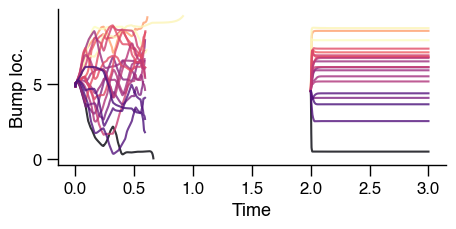

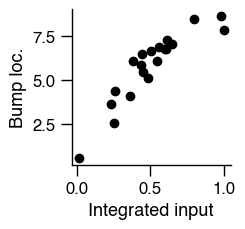

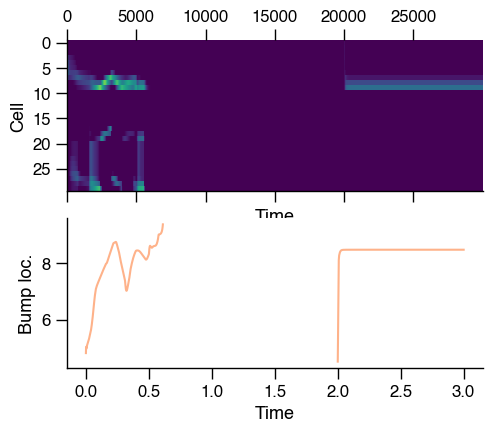

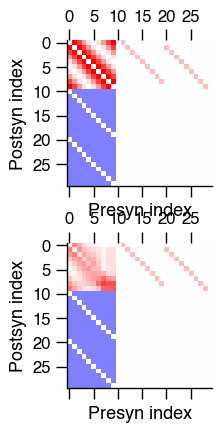

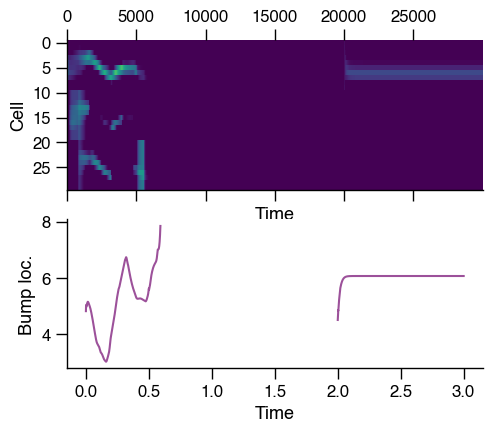

...

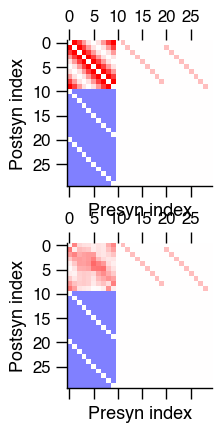

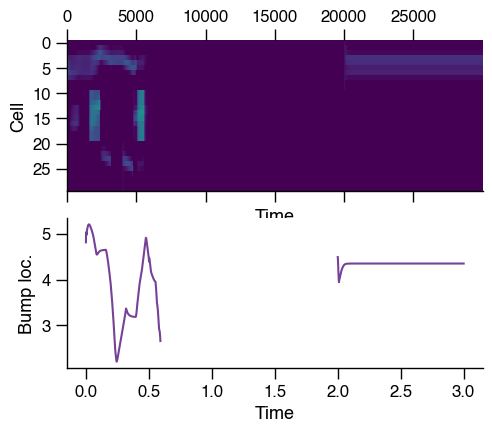

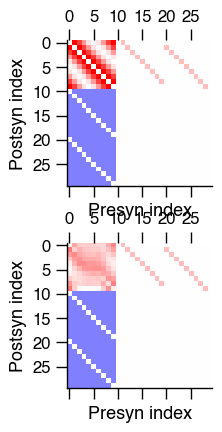

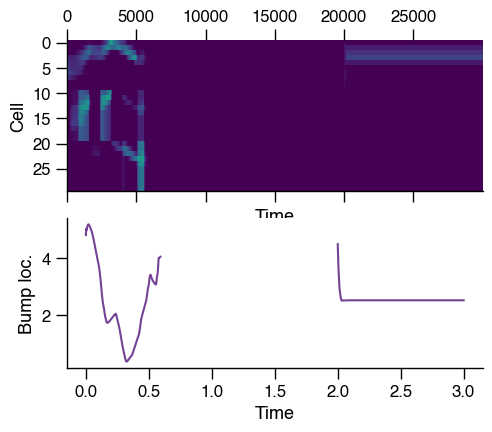

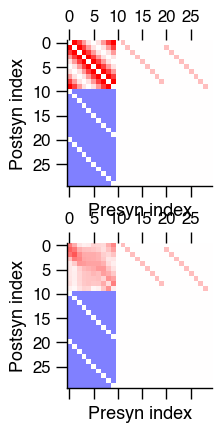

In [202]:
n = 10

def make_u_funcs(n_trials, n, t, dt):    
    def u_func(t_prime, inp):
        return np.concatenate(
            [
                np.array([
                    np.interp(t_prime, t, inp[2+i, :])
                    for i in range(n)
                ]),
                np.repeat(np.interp(t_prime, t, inp[0, :]), n),
                np.repeat(np.interp(t_prime, t, inp[1, :]), n),
            ]
        )

    funcs = []
    all_inps = []

    for i in range(n_trials):
        block_len = 0.1
        inp = np.zeros((2 + n, len(t)))
        for t_p in np.linspace(0, t.max(), int((t.max() + 1)/block_len)):
            if t_p < 0.5:
                u_block = np.random.rand(2)
            else:
                u_block = np.zeros((2))
            inp[:2, int(t_p/dt):int((t_p + block_len)/dt)] = 0.7 * u_block[:, None]
        inp[2:, :int(0.5/dt)] = 0.5
        inp[2:, int(2/dt):] = 0.5
        all_inps.append(inp)
        funcs.append(partial(u_func, inp=inp))
    return funcs, all_inps

u_funcs, all_inps = make_u_funcs(20, n, np.arange(0, 3, dt), dt=dt)

print(len(u_funcs))

run_simulation(
    x_init_peak_locs=[0.5] * len(u_funcs),
    n=n,
    u_funcs=u_funcs,
    homeo_rate=10,
    presyn_setpoint=5,
    learning_rate=10,
    alpha=200,
    seed=15,
    weight_perturbation=0,
    noise_std=0.2,
    t_sim=(0, 3),
    make_cbar=True,
    save_path='figures/handbuilt_rules/2d_handbuilt_ex_tuned',
    y_lim_2=(-1.2, 1.2),
    y_lim_3=(1, 2),
    y_lim_4=(0, 1),
    w_e_scale=2.3,
    w_inh=np.random.normal(size=(n,), loc=1, scale=0.05) * 2,
    color_by=np.array([(inp[1].sum() - inp[0].sum()) for inp in all_inps]),
)
None

20
Running simulations for 20 initial conditions...


/var/folders/rp/n8h2l6w51774kxnq18z19s8r0000gn/T/ipykernel_63448/3682809666.py:234: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, axes = plt.subplots(2, 1, figsize=(8 * scale * width, 7 * scale))


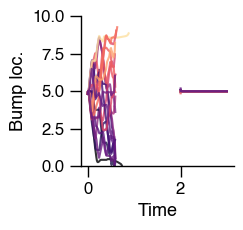

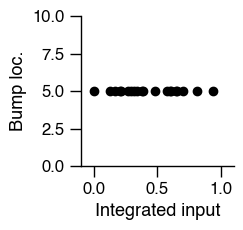

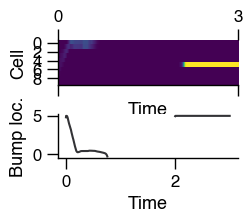

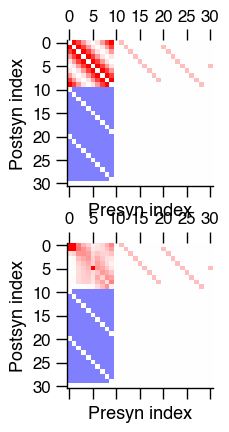

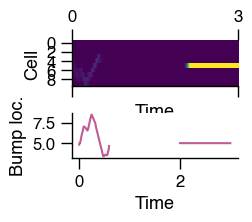

...

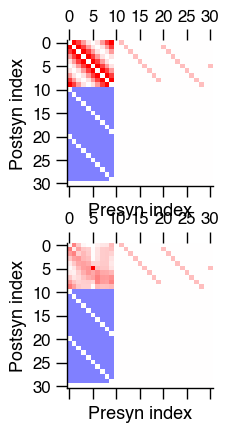

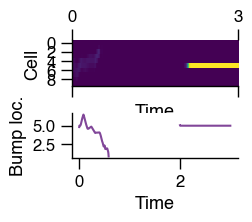

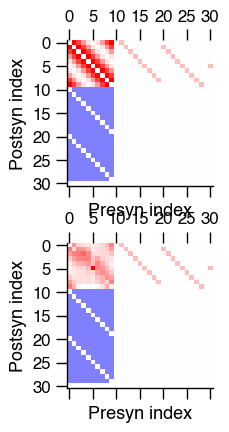

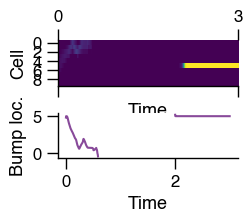

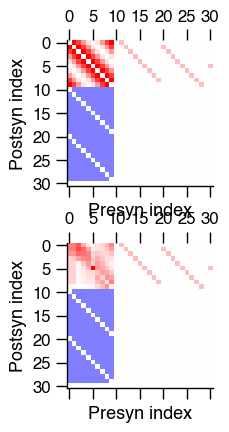

In [267]:
n = 10

def make_u_funcs(n_trials, n, t, dt):    
    def u_func(t_prime, inp):
        return np.concatenate(
            [
                np.array([
                    np.interp(t_prime, t, inp[2+i, :])
                    for i in range(n)
                ]),
                np.repeat(np.interp(t_prime, t, inp[0, :]), n),
                np.repeat(np.interp(t_prime, t, inp[1, :]), n),
                np.array([np.interp(t_prime, t, inp[n+2, :])]),
            ]
        )

    funcs = []
    all_inps = []

    for i in range(n_trials):
        block_len = 0.1
        inp = np.zeros((2 + n + 1, len(t)))
        for t_p in np.linspace(0, t.max(), int((t.max() + 1)/block_len)):
            if t_p < 0.5:
                u_block = np.random.rand(2)
            else:
                u_block = np.zeros((2))
            inp[:2, int(t_p/dt):int((t_p + block_len)/dt)] = 0.7 * u_block[:, None]
        inp[2:2+n, :int(0.5/dt)] = 0.5
        inp[2+n, int(2/dt):int(2.1/dt)] = 0.5 * np.ones((int(0.1/dt),))
        inp[2:2+n, int(2.1/dt):] = 0.5
        all_inps.append(inp)
        funcs.append(partial(u_func, inp=inp))
    return funcs, all_inps

u_funcs, all_inps = make_u_funcs(20, n, np.arange(0, 3, dt), dt=dt)

print(len(u_funcs))

run_simulation(
    x_init_peak_locs=[0.5] * len(u_funcs),
    n=n,
    u_funcs=u_funcs,
    homeo_rate=10,
    presyn_setpoint=5,
    learning_rate=10,
    alpha=200,
    seed=20,
    weight_perturbation=0,
    noise_std=0.2,
    t_sim=(0, 3),
    make_cbar=True,
    save_path='figures/handbuilt_rules/2d_handbuilt_ex_tuned',
    y_lim_2=(-1.2, 1.2),
    y_lim_3=(1, 2),
    y_lim_4=(0, 1),
    w_e_scale=2.3,
    w_inh=np.random.normal(size=(n,), loc=1, scale=0) * 2,
    color_by=np.array([(inp[1].sum() - inp[0].sum()) for inp in all_inps]),
)
None